## Exploratory Data Analysis (EDA)

Conducting EDA on the NHL shot data from 2007 through 2022 to examine relationships between variables and identify patterns in the data. The purpose is to gain insight on which variables will be most important when predicting the amount of goals a player will score in a season.  
I believe factors such as the distance from the net, angle of the shot, type of shot, and what happened before the shot are going to be key factors in my model.  
In addition, I believe there maybe columns that can be eliminated/left out of the final model since they are providing very similar information.

In [1]:
#Load relevant Libraries

import pandas as pd
from pandas.plotting import scatter_matrix
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import scale, normalize
import os

## Load and Inspect Dataframe

In [2]:
#load data

shots_07_22_cleaned = pd.read_csv(r"C:\Users\Travi\OneDrive\Documents\GitHub\Springboard Capstone 2\Springboard-Data-Science-Capstone-Project-2\nhl data\shots_07_22_cleaned.csv.csv")
shots_07_22_cleaned.head()

,shotID,homeTeamCode,awayTeamCode,season,game_id,id,timeUntilNextEvent,timeSinceLastEvent,period,team,...,xGoal,xFroze,xRebound,xPlayContinuedInZone,xPlayContinuedOutsideZone,xPlayStopped,xShotWasOnGoal,shotWasOnGoal,teamCode,arenaAdjustedXCordABS
0,0,NSH,SJS,2022,20001,8,1.0,6,1,AWAY,...,0.026009,0.214393,0.037040,0.398742,0.300830,0.022987,0.710473,1.0,SJS,47.0
1,2,NSH,SJS,2022,20001,15,2.0,3,1,HOME,...,0.046070,0.256798,0.051420,0.358080,0.259696,0.027936,0.644651,1.0,NSH,31.0
2,3,NSH,SJS,2022,20001,16,0.0,2,1,HOME,...,0.296800,0.172590,0.092112,0.230564,0.183049,0.024885,0.898032,1.0,NSH,76.0
3,4,NSH,SJS,2022,20001,18,1.0,11,1,HOME,...,0.057435,0.128260,0.062224,0.446106,0.286419,0.019556,0.759405,1.0,NSH,82.0
4,6,NSH,SJS,2022,20001,26,25.0,7,1,AWAY,...,0.084009,0.083920,0.046011,0.454167,0.309893,0.022000,0.536515,1.0,SJS,75.0


In [3]:
#Verify column names are correct

shots_07_22_cleaned.columns

Index(['shotID', 'homeTeamCode', 'awayTeamCode', 'season', 'game_id', 'id',
       'timeUntilNextEvent', 'timeSinceLastEvent', 'period', 'team',
       'location', 'event', 'goal', 'shotGeneratedRebound', 'xCord', 'yCord',
       'xCordAdjusted', 'yCordAdjusted', 'shotAngle', 'shotAngleAdjusted',
       'shotAnglePlusRebound', 'shotAngleReboundRoyalRoad', 'shotDistance',
       'shotType', 'shotOnEmptyNet', 'shotRebound',
       'shotAnglePlusReboundSpeed', 'shotRush', 'speedFromLastEvent',
       'lastEventxCord', 'lastEventyCord', 'distanceFromLastEvent',
       'lastEventShotAngle', 'lastEventShotDistance', 'lastEventCategory',
       'homeEmptyNet', 'awayEmptyNet', 'homeSkatersOnIce', 'awaySkatersOnIce',
       'awayPenalty1Length', 'homePenalty1Length',
       'playerPositionThatDidEvent', 'playerNumThatDidEvent',
       'lastEventxCord_adjusted', 'lastEventyCord_adjusted',
       'timeSinceFaceoff', 'shooterPlayerId', 'shooterName',
       'shooterLeftRight', 'arenaAdjustedShotDi

In [4]:
#Check shape to verify dataframe loaded as excpected

shots_07_22_cleaned.shape

(1239049, 63)

In [5]:
#Verify that there is no missing values

missing = pd.concat([shots_07_22_cleaned.isnull().sum(), 100 * shots_07_22_cleaned.isnull().mean()], axis=1)
missing.columns=['count', '%']
missing.sort_values(by='%', ascending=False)

,count,%
shotID,0,0.0
homeTeamCode,0,0.0
awayTeamCode,0,0.0
season,0,0.0
game_id,0,0.0
...,...,...
xPlayStopped,0,0.0
xShotWasOnGoal,0,0.0
shotWasOnGoal,0,0.0
teamCode,0,0.0


In [6]:
#Descriptive statistics to get a sense of the data distubutions

shots_07_22_cleaned.describe()

,shotID,season,game_id,id,timeUntilNextEvent,timeSinceLastEvent,period,goal,shotGeneratedRebound,xCord,...,arenaAdjustedYCordAbs,xGoal,xFroze,xRebound,xPlayContinuedInZone,xPlayContinuedOutsideZone,xPlayStopped,xShotWasOnGoal,shotWasOnGoal,arenaAdjustedXCordABS
count,1.239049e+06,1.239049e+06,1.239049e+06,1.239049e+06,1.239049e+06,1.239049e+06,1.239049e+06,1.239049e+06,1.239049e+06,1.239049e+06,...,1.239049e+06,1.239049e+06,1.239049e+06,1.239049e+06,1.239049e+06,1.239049e+06,1.239049e+06,1.239049e+06,1239049.0,1.239049e+06
mean,7.443812e+05,2.014586e+03,2.129817e+04,1.601133e+02,9.946863e+00,1.553554e+01,2.031719e+00,9.213598e-02,5.961588e-02,2.726785e-01,...,1.585539e+01,7.133006e-02,1.646989e-01,5.018846e-02,3.921434e-01,2.969566e-01,2.335783e-02,7.304724e-01,1.0,5.960327e+01
std,4.827778e+05,4.656415e+00,2.512397e+03,9.215437e+01,1.459744e+01,1.491295e+01,8.472311e-01,2.892179e-01,2.367739e-01,6.335969e+01,...,1.132202e+01,1.020332e-01,6.045404e-02,2.442053e-02,9.246095e-02,1.051429e-01,9.835124e-03,1.106631e-01,0.0,1.884249e+01
min,0.000000e+00,2.007000e+03,2.000100e+04,2.000000e+00,-2.147000e+03,-1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,-9.900000e+01,...,0.000000e+00,1.000000e-03,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.0,0.000000e+00
25%,3.062510e+05,2.010000e+03,2.031900e+04,8.100000e+01,1.000000e+00,5.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,-6.300000e+01,...,5.000000e+00,1.493150e-02,1.251200e-01,3.526130e-02,3.559870e-01,2.510120e-01,1.942150e-02,6.756440e-01,1.0,4.500000e+01
50%,7.346440e+05,2.015000e+03,2.063900e+04,1.590000e+02,4.000000e+00,1.100000e+01,2.000000e+00,0.000000e+00,0.000000e+00,-1.000000e+00,...,1.500000e+01,3.594560e-02,1.562830e-01,4.362420e-02,4.099420e-01,2.948720e-01,2.166450e-02,7.289150e-01,1.0,6.200000e+01
75%,1.165168e+06,2.018000e+03,2.098000e+04,2.350000e+02,1.400000e+01,2.100000e+01,3.000000e+00,0.000000e+00,0.000000e+00,6.400000e+01,...,2.500000e+01,8.650740e-02,1.956850e-01,6.016870e-02,4.488350e-01,3.241900e-01,2.480720e-02,7.864090e-01,1.0,7.600000e+01
max,1.595716e+06,2.022000e+03,3.041700e+04,7.760000e+02,1.284000e+03,2.340000e+02,8.000000e+00,1.000000e+00,1.000000e+00,9.900000e+01,...,5.200000e+01,9.877570e-01,7.647630e-01,2.833440e-01,7.271680e-01,9.590000e-01,5.826250e-01,9.934680e-01,1.0,9.900000e+01


## Wrangle Data

After reviewing the data frame, there is a couple of features I would like to add:  
* power play goals
* scoring situation

This is because in these situations the amount of skaters on the ice is imbalanced between the teams and, in theory, should increase the probability of a goal.  

In [7]:
#Add a new column to the dataframe to easily identify Power Play goals

shots_07_22_cleaned['power_play'] = shots_07_22_cleaned.apply\
                                    (lambda row: "1" if row['homePenalty1Length'] or row['awayPenalty1Length'] > 0 else "0", axis=1)
shots_07_22_cleaned['power_play'] = shots_07_22_cleaned['power_play'].astype(int)

In [8]:
#Subset the data to include only shots that were goals
#We are interested in what these shots have in common that lead to a goal

all_goals = shots_07_22_cleaned.loc[shots_07_22_cleaned['goal'] != 0].copy()
all_goals.shape

(114161, 64)

In [9]:
#Add a new column to the dataframe to identify how many skaters from each team were on the ice at the time of the goal.

def determine_situation(row):
    if row.loc['team'] == 'HOME' and row.loc['homeSkatersOnIce'] == 5 and row.loc['awaySkatersOnIce'] == 6:
        return '5v6'
    elif row.loc['team'] == 'HOME' and row.loc['homeSkatersOnIce'] == 6 and row.loc['awaySkatersOnIce'] == 5:
        return '6v5'
    elif row.loc['team'] == 'HOME' and row.loc['homeSkatersOnIce'] == 5 and row.loc['awaySkatersOnIce'] == 4:
        return '5v4'
    elif row.loc['team'] == 'HOME' and row.loc['homeSkatersOnIce'] == 5 and row.loc['awaySkatersOnIce'] == 3:
        return '5v3'
    elif row.loc['team'] == 'HOME' and row.loc['homeSkatersOnIce'] == 4 and row.loc['awaySkatersOnIce'] == 5:
        return '4v5'
    elif row.loc['team'] == 'HOME' and row.loc['homeSkatersOnIce'] == 3 and row.loc['awaySkatersOnIce'] == 5:
        return '3v5'
    elif row.loc['team'] == 'AWAY' and row.loc['homeSkatersOnIce'] == 5 and row.loc['awaySkatersOnIce'] == 6:
        return '6v5'
    elif row.loc['team'] == 'AWAY' and row.loc['homeSkatersOnIce'] == 6 and row.loc['awaySkatersOnIce'] == 5:
        return '5v6'
    elif row.loc['team'] == 'AWAY' and row.loc['homeSkatersOnIce'] == 4 and row.loc['awaySkatersOnIce'] == 5:
        return '5v4'
    elif row.loc['team'] == 'AWAY' and row.loc['homeSkatersOnIce'] == 3 and row.loc['awaySkatersOnIce'] == 5:
        return '5v3'
    elif row.loc['team'] == 'AWAY' and row.loc['homeSkatersOnIce'] == 5 and row.loc['awaySkatersOnIce'] == 4:
        return '4v5'
    elif row.loc['team'] == 'AWAY' and row.loc['homeSkatersOnIce'] == 5 and row.loc['awaySkatersOnIce'] == 3:
        return '3v5'
    else:
        return '5v5'

# Adding the new column

all_goals['situation'] = all_goals.apply(determine_situation, axis=1)
all_goals.head()

,shotID,homeTeamCode,awayTeamCode,season,game_id,id,timeUntilNextEvent,timeSinceLastEvent,period,team,...,xRebound,xPlayContinuedInZone,xPlayContinuedOutsideZone,xPlayStopped,xShotWasOnGoal,shotWasOnGoal,teamCode,arenaAdjustedXCordABS,power_play,situation
2,3,NSH,SJS,2022,20001,16,0.0,2,1,HOME,...,0.092112,0.230564,0.183049,0.024885,0.898032,1.0,NSH,76.0,0,5v5
11,16,NSH,SJS,2022,20001,62,0.0,27,1,AWAY,...,0.069527,0.415863,0.295982,0.021140,0.800991,1.0,SJS,80.0,0,5v5
25,38,NSH,SJS,2022,20001,143,0.0,20,2,HOME,...,0.038784,0.422444,0.318003,0.022092,0.693893,1.0,NSH,65.0,0,5v5
44,64,NSH,SJS,2022,20001,215,0.0,9,2,HOME,...,0.052278,0.413043,0.334459,0.020686,0.708772,1.0,NSH,66.0,0,5v5
62,91,NSH,SJS,2022,20001,318,32.0,45,3,HOME,...,0.022973,0.126682,0.093293,0.011140,0.719935,1.0,NSH,60.0,0,5v6


## Evaluating Feature Distubutions

Total percentage of goals scored on the Power Play: 16.92 %


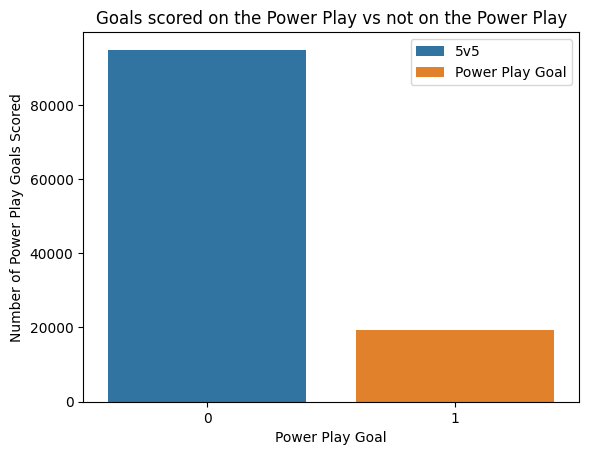

In [10]:
#Looking at distubution of Power Play goals

pp_goals = all_goals[all_goals['power_play']!=0]
sns.countplot(data=all_goals, x='power_play',  hue='power_play')
plt.xlabel('Power Play Goal')
plt.ylabel('Number of Power Play Goals Scored')
plt.title('Goals scored on the Power Play vs not on the Power Play')
plt.legend(["5v5", "Power Play Goal"])

total = len(all_goals)
pp_goals = (all_goals['power_play']!=0).sum()
print(f"Total percentage of goals scored on the Power Play: {"%.2f"%(100 * (pp_goals/total))} %")

Power play goals only accounted for 16.92% of the total goals scored. This is a little bit lower than I initially thought it would be. I was expecting a number a little closer to 20%. 

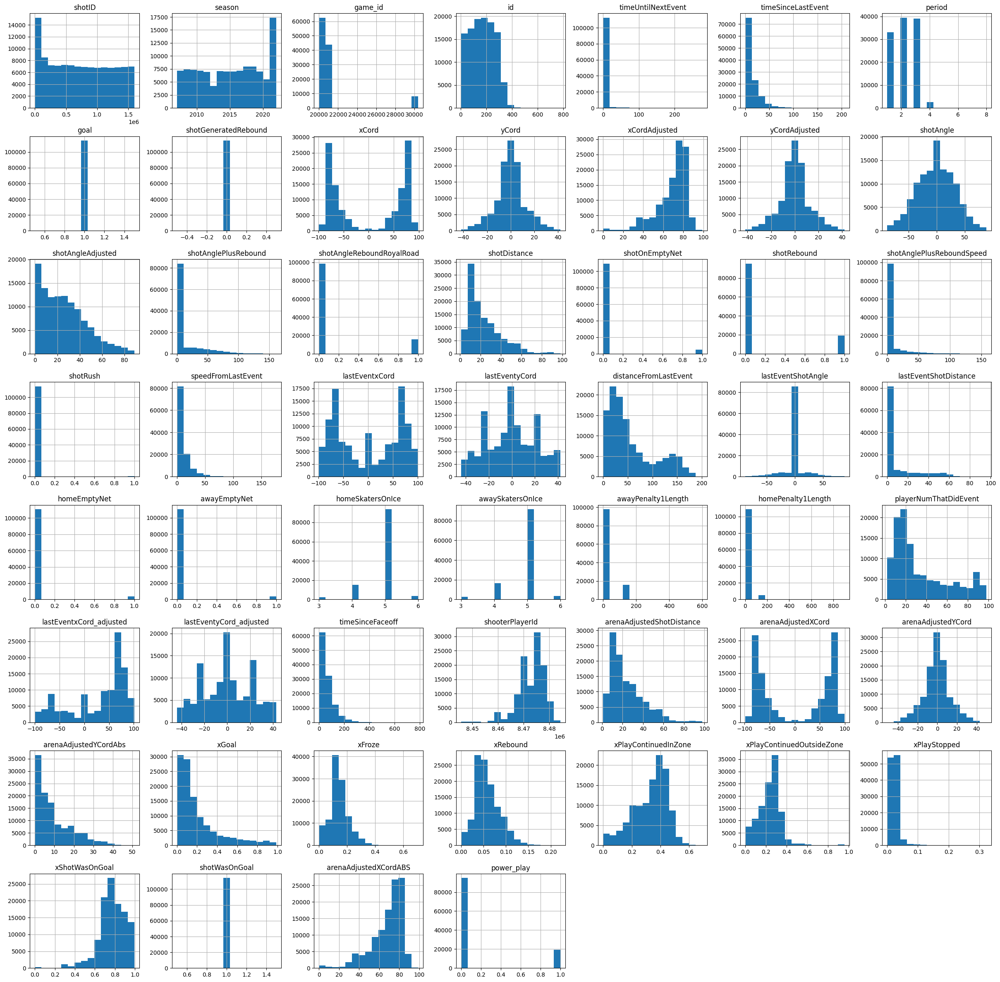

In [11]:
#Plotting the remaining numberical features

all_goals.hist(bins= 15, figsize=(30,30))
plt.show()

### Observations:  
The distributions for the numeric features are within expectation given some domain knowledge of hockey. There is some mix of uniformly distributed features and skewed features. I will most likely have to preform some form of transformation on my data in the next stage.   

  Features of current interest:  

* Distance from the net = It appears most goals are scored close to the net, within 15 feet or so. This is expected and given the pretty heavy right skew of the distribution, I would say this is a good sign of being a key factor for my model.  

* Angle of the shot = The shot angle has a pretty good bell shape and normal distribution with a spike in the center at 0. This is expected as a shot at 0 would be directly in front of the center of the goal and in theory would give the shot a higher probability of being a goal.

Overall these distributions have helped support these features of interest being key factors in goal prediction. However, there are still the categorical features to explore along with feature correlation before we can move forward with confidence.

In [12]:
#Subset the data frame for categorical features

object_columns = all_goals.select_dtypes(object)
object_columns_no_shooter = object_columns.drop(['shooterName', 'event', 'situation'], axis=1)

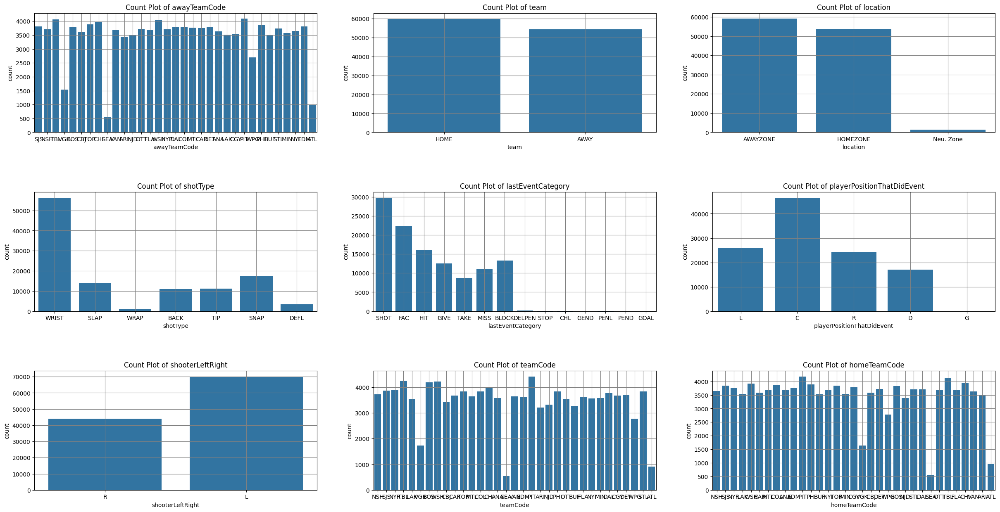

In [13]:
#Plotting the remaining categorical features

fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(30, 15))
cols = object_columns_no_shooter.columns
axes = axes.flatten()

for i, col in enumerate(cols):
    sns.countplot(x=col, data=object_columns_no_shooter, ax=axes[i-1])
    axes[i-1].set_title(f'Count Plot of {col}')
    axes[i-1].grid(True,color = "grey")


plt.subplots_adjust(hspace=0.5)
plt.show()

### Observations:  

  Similarly to the numerical features, the categorical features are within expectation for the most part. There was a few trends that I did find somewhat surprising. 

  The first surprising trend was the fact that left handed shooters outscored right handed shooters by around 25,000. I figured that distribution would be closer. This possibly suggest left handed shooters have a higher probability of scoring goals.  
  
  The second surprising trend was how big the difference was in goals scored by centers compared to other positions. It is expected that other positions like defense are not expected to score as much. I did not anticipate as large of a gap between center and the wing players. This feature will be of further interest. 

   Features of current interest:  

   * Type of shot = This distribution is skewed pretty heavily towards wrist shots. I knew that wrist shots are the most common and is a easier shot from a technical standpoint than the other types of shots. However, I was not expecting the large gap between wrist shot and its closest competitor the snap shot with a difference of around 40,000. This is also a good indicator that this will be a key feature. 
   * Event before the shot = This distribution is well within expectations. There was not really any surprises. It is fairly skewed towards a shot being the last event before a goal, suggesting most goals come after a previous shot or rebound. However, we will need further investigation to determine if this will be a key factor.


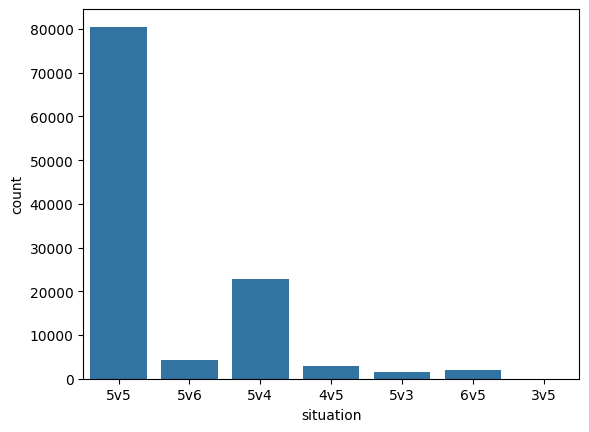

In [14]:
#Plotting distrubution of "situation" column

sns.countplot(x=all_goals['situation'], data=all_goals)
plt.show()

I also wanted to look at how many skaters were on the ice at the time of the goal. The first number is the amount of skaters that the goal scoring team had on the ice and the second number is the amount of skaters the defending team had on the ice.  

  This distribution is within expectation and no real surprises.


# Visualizing Goal Locations 

Next, I wanted to see if there was any ready trend or pattern in the locations of goals scored. 

In [15]:
#Creating a subset of the dataframe to include shot locations based on season

goal_locations = all_goals[['xCord', 'yCord','season']]
goal_locations_by_season = goal_locations.groupby('season')

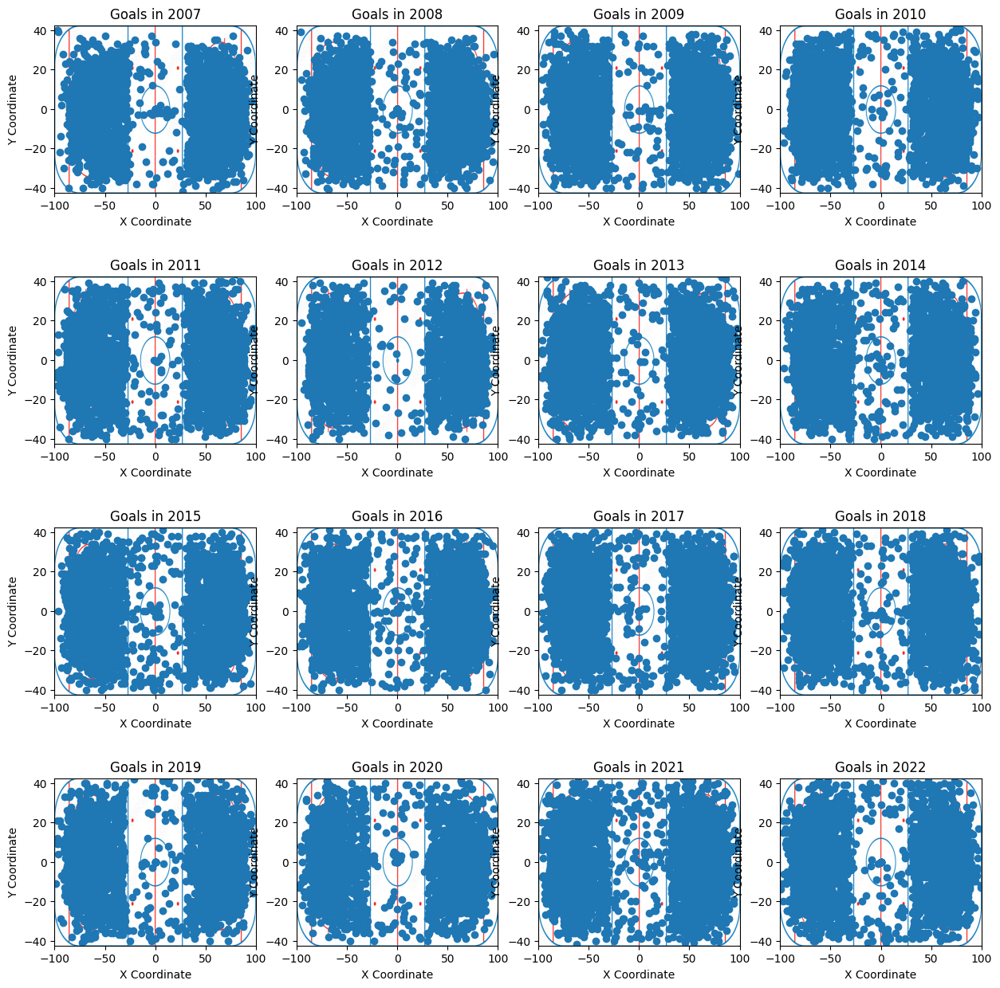

In [16]:
#Visualizing shot locations across all seasons

seasons = list(range(2007,2023))
img = mpimg.imread(r"C:\Users\Travi\Downloads\rink2.png")
fig, axs = plt.subplots(4, 4, figsize=(15, 15))
axs = axs.flatten()


for i, season in enumerate(seasons):
    season_data = goal_locations[goal_locations['season'] == season]
    axs[i].scatter(season_data['xCord'], season_data['yCord'])
    axs[i].set_title(f'Goals in {season}')
    axs[i].set_xlabel('X Coordinate')
    axs[i].set_ylabel('Y Coordinate')
    axs[i].imshow(img, extent=[-100, 100, -42.5, 42.5], aspect='auto', zorder=-1)
    plt.subplots_adjust(hspace=0.5);
plt.show()


### Observations  

  There is no real pattern or trend in goal locations. As expected, much fewer goals are scored in the center section of the ice. But there does not appear to be a clear indication that more goals are scored in one particular area.

Due to the somewhat large dimensionality of my dataset, I want to look at the PCA to get a sense if I can possibly reduce the dimensionality of my dataset without sacrificing model performance.

In [17]:
#isolate the numeric columns of my data set
numeric_columns = all_goals.select_dtypes(include= ('int', 'float64'))
scaled_columns = numeric_columns.columns

#scaling the data for PCA

all_goals_scaled = scale(numeric_columns)
all_goals_scaled_df = pd.DataFrame(all_goals_scaled, columns=scaled_columns)
all_goals_scaled_df.head()

,shotID,season,game_id,id,timeUntilNextEvent,timeSinceLastEvent,period,goal,shotGeneratedRebound,xCord,...,xGoal,xFroze,xRebound,xPlayContinuedInZone,xPlayContinuedOutsideZone,xPlayStopped,xShotWasOnGoal,shotWasOnGoal,arenaAdjustedXCordABS,power_play
0,-1.502810,1.552362,-0.514184,-1.641464,-0.118065,-0.755647,-1.295133,0.0,0.0,-1.051312,...,0.437436,0.431551,1.278965,-0.844706,-0.505386,0.047486,0.955323,0.0,0.491647,-0.451328
1,-1.502783,1.552362,-0.514184,-1.147693,-0.118065,0.949481,-1.295133,0.0,0.0,1.094979,...,-0.611928,-0.329229,0.435653,0.712085,0.567465,-0.256061,0.224228,0.0,0.746918,-0.451328
2,-1.502738,1.552362,-0.514184,-0.278227,-0.118065,0.472045,-0.116199,0.0,0.0,0.883174,...,-0.647002,-0.202524,-0.712223,0.767376,0.776662,-0.178887,-0.582636,0.0,-0.210349,-0.451328
3,-1.502685,1.552362,-0.514184,0.494632,-0.118065,-0.278211,-0.116199,0.0,0.0,0.883174,...,-0.648321,-0.481830,-0.208376,0.688393,0.932992,-0.292860,-0.470539,0.0,-0.146531,-0.451328
4,-1.502629,1.552362,-0.514184,1.600250,3.864228,2.177172,1.062735,0.0,0.0,-0.811266,...,2.487039,-1.851262,-1.302611,-1.717472,-1.358060,-1.066581,-0.386438,0.0,-0.529437,-0.451328


In [18]:
#fit and plot the PCA

goals_pca = PCA().fit(all_goals_scaled)

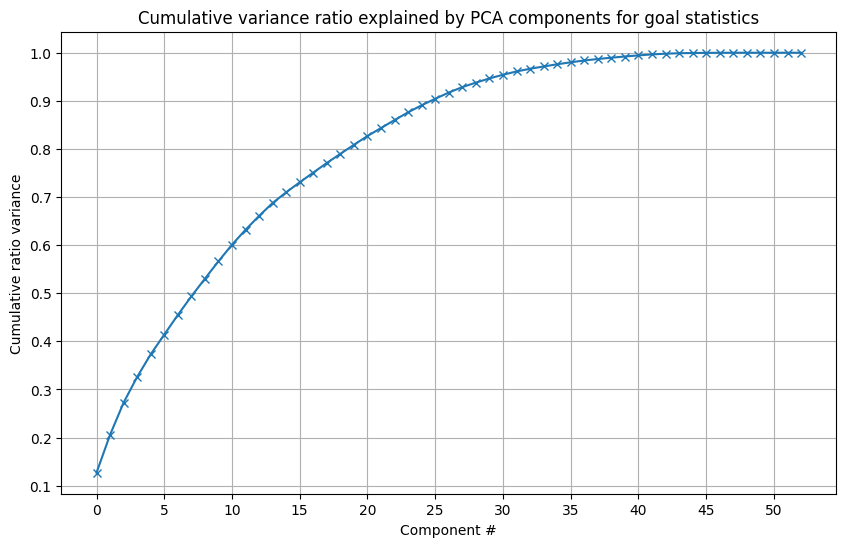

In [19]:
plt.subplots(figsize=(10, 6))
plt.plot(goals_pca.explained_variance_ratio_.cumsum(), marker='x')
plt.grid()
plt.xticks([0,5,10,15,20,25,30,35,40,45,50])
plt.yticks([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])
plt.xlabel('Component #')
plt.ylabel('Cumulative ratio variance')
plt.title('Cumulative variance ratio explained by PCA components for goal statistics');

### Observations:  

  The PCA plot above again strengthens a case to reduce the dimensionality of my data set to obtain a more accurate model.  

The first 18 components account for around 80% of the variance and the first 25 components account for 90% of the variance. 

## Visualizing Relationships Between Features

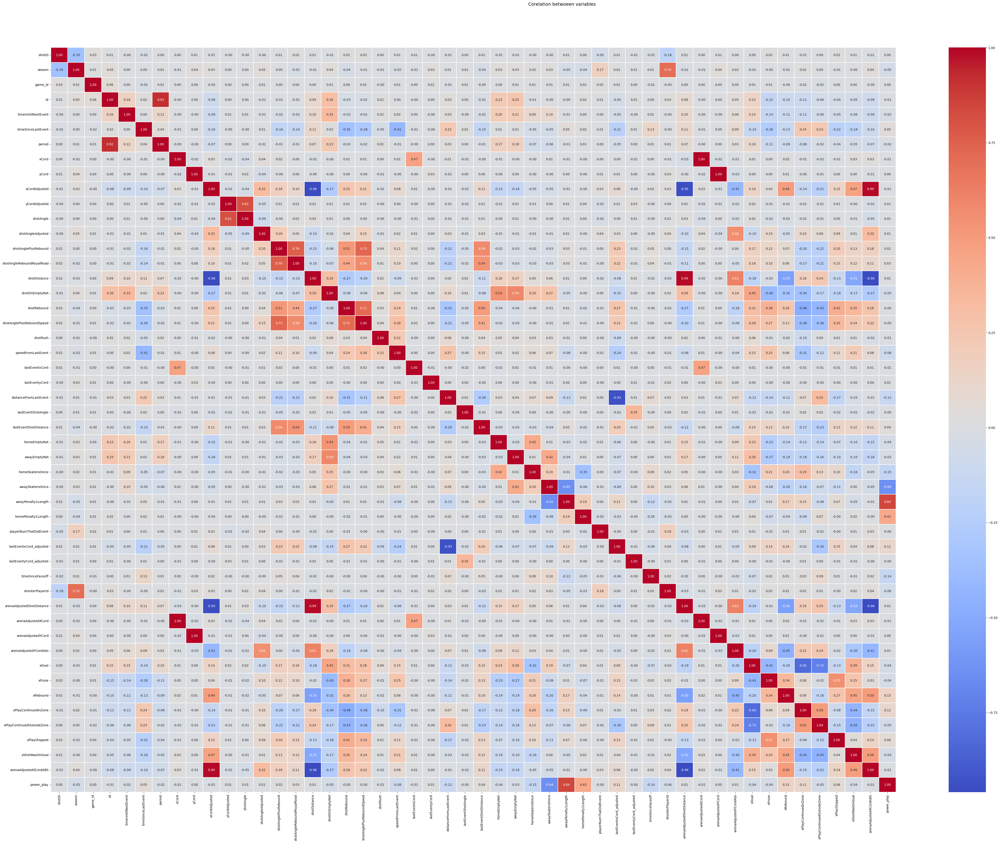

In [20]:
#Correlation heatmap of the numeric columns of the all_goals data frame

corrmat_goals = numeric_columns.drop(numeric_columns[['goal', 'shotGeneratedRebound', 'shotWasOnGoal']], axis=1).corr()
f, ax = plt.subplots(figsize=(60, 40))
hm = sns.heatmap(round(corrmat_goals,2), annot=True, ax=ax, cmap="coolwarm",fmt='.2f',
                 linewidths=.05)
f.subplots_adjust(top=0.93)
t= f.suptitle('Corelation betwoeen variables', fontsize=14)

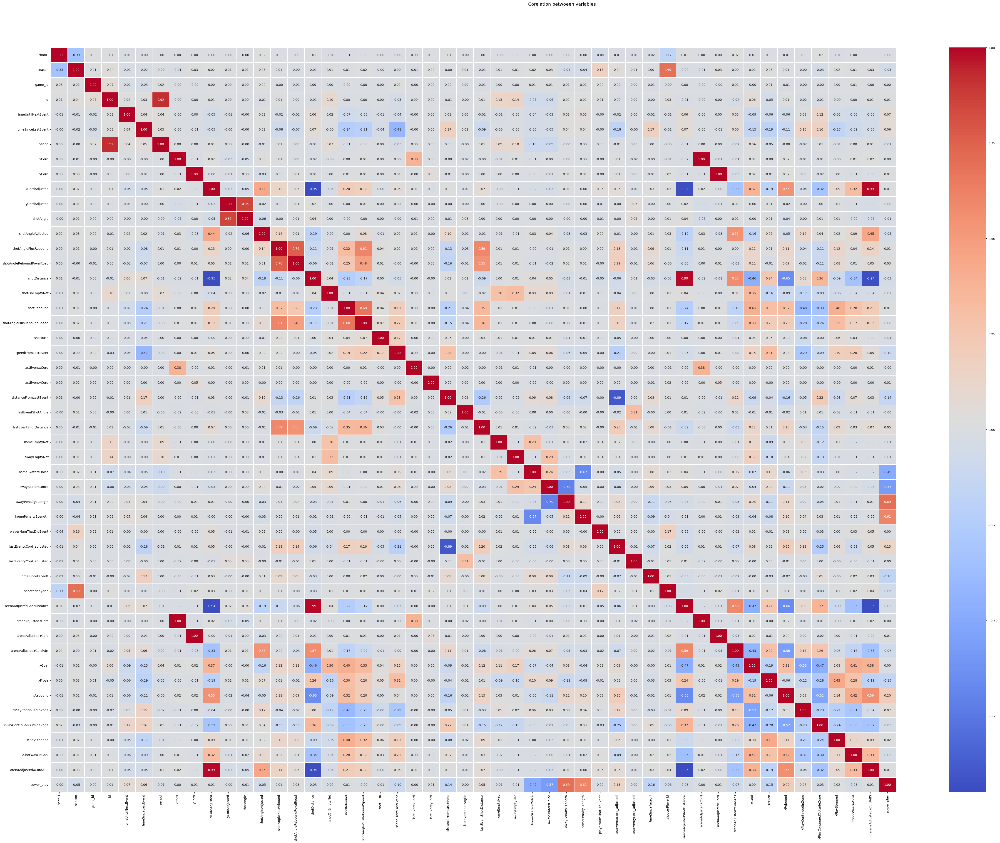

In [21]:
#Correlation heatmap of the numeric columns of the shots_07_22_cleaned data frame

numeric_columns_shots = shots_07_22_cleaned.select_dtypes(include= ('int', 'float64'))
corrmat_shots = numeric_columns_shots.drop(numeric_columns_shots[['goal', 'shotGeneratedRebound','shotWasOnGoal']], axis=1).corr()
f, ax = plt.subplots(figsize=(60, 40))
hm = sns.heatmap(round(corrmat_shots,2), annot=True, ax=ax, cmap="coolwarm",fmt='.2f',
                 linewidths=.05)
f.subplots_adjust(top=0.93)
t= f.suptitle('Corelation betwoeen variables', fontsize=14)

Due to the large amount of variables, the heatmap allowed me to visually identify some possible moderate and strong correlations. However, I will need to take a closer look at the numbers which is a little difficult with this amount of features.  

  I will start by looking at the target feature and compare the correlation with the remaining features.

In [22]:
# Corriclation between the taget feature xGoal (The probability the shot will be a goal) and the remaining features

target_corr = numeric_columns[numeric_columns.columns[1:]].corr()['xGoal'][:].dropna()
target_corr.sort_values(ascending=False)

xGoal                        1.000000
shotOnEmptyNet               0.451395
xShotWasOnGoal               0.394471
shotRebound                  0.306093
awayEmptyNet                 0.298456
shotAnglePlusReboundSpeed    0.276862
homeEmptyNet                 0.232104
awaySkatersOnIce             0.190350
shotAnglePlusRebound         0.166923
shotAngleReboundRoyalRoad    0.156135
arenaAdjustedXCordABS        0.152618
timeUntilNextEvent           0.151507
speedFromLastEvent           0.146254
id                           0.145513
lastEventShotDistance        0.145426
xCordAdjusted                0.143605
period                       0.095784
lastEventxCord_adjusted      0.091280
shotRush                     0.060939
homePenalty1Length           0.043734
shotAngle                    0.017117
yCordAdjusted                0.016580
arenaAdjustedXCord           0.014330
xCord                        0.014167
lastEventxCord               0.013743
game_id                      0.012465
playerNumTha

In [23]:
lower_threshold = 0.5
upper_threshold = 0.7

target_mod_to_strong_corr = target_corr[abs(target_corr) > lower_threshold]
target_mod_to_strong_corr.sort_values(ascending=False)

xGoal                        1.000000
xPlayContinuedOutsideZone   -0.724290
xPlayContinuedInZone        -0.819645
Name: xGoal, dtype: float64

### Observations:  

  It appears that our target feature has does not have a moderate correlation with any features. The closest was with shotOnEmptyNet with r=0.45 or xFroze at r=-4.1

  The target feature has a strong correlation with the following features:  
  * xPlayContinuedOutsideZone = -0.724290 - The probability that the play leaves the zone after the shot - negative correlation
  * xPlayContinuedInZone = -0.819645 - The probability that the play will continue in the zone after the shot. Defined as the next event after the shot also occurring in the offensive zone and no player changes occurring. Does not include the xRebound probability - negative correlation


  This could be an indication of multicollinearity which I suspected in the beginning with other features. I will investigate multicollinearity with those other features in the next step.

## Determine Strength Of Feature Correlation

Next I wanted to find all the features that had moderate and strong correlations between each other.

In [24]:
#Subsetting correlation map to include only correlations that are considered moderate (above 0.3) and strong (above 0.7)

lower_threshold = 0.4
upper_threshold = 0.7

subset_df = corrmat_goals[(abs(corrmat_goals) > lower_threshold) | (abs(corrmat_goals) < upper_threshold)].fillna(0)
subset_df.head()

,shotID,season,game_id,id,timeUntilNextEvent,timeSinceLastEvent,period,xCord,yCord,xCordAdjusted,...,arenaAdjustedYCordAbs,xGoal,xFroze,xRebound,xPlayContinuedInZone,xPlayContinuedOutsideZone,xPlayStopped,xShotWasOnGoal,arenaAdjustedXCordABS,power_play
shotID,1.000000,-0.348711,0.030158,0.010336,-0.000547,-0.015160,0.004449,0.003245,0.005674,-0.008387,...,0.004299,0.001875,0.019031,0.009418,-0.012624,0.001511,0.016078,0.009226,-0.009035,0.003160
season,-0.348711,1.000000,0.005505,0.051399,0.003239,0.001858,0.010283,-0.010650,0.042595,0.026044,...,0.023596,-0.006813,-0.001906,-0.005911,0.020897,0.001073,-0.005630,-0.001176,0.035238,-0.050842
game_id,0.030158,0.005505,1.000000,0.064761,0.004171,-0.023863,0.014316,0.003632,0.002502,-0.000809,...,0.004893,0.012465,0.005120,-0.002831,-0.010225,-0.019178,0.002770,0.004289,-0.001023,0.004966
id,0.010336,0.051399,0.064761,1.000000,0.158047,0.020998,0.920620,-0.003791,0.003733,-0.081411,...,0.045239,0.145513,-0.145192,-0.101716,-0.107692,-0.059299,-0.042028,-0.053771,-0.080347,-0.007375
timeUntilNextEvent,-0.000547,0.003239,0.004171,0.158047,1.000000,0.004127,0.120547,-0.000539,-0.000628,-0.093693,...,0.062700,0.151507,-0.136472,-0.106725,-0.109266,-0.060923,-0.052515,-0.059736,-0.092974,-0.015628


In [25]:
#Data frame of features with moderate correlation

result_moderate = pd.DataFrame(abs(subset_df)[abs(subset_df) > lower_threshold].stack())
result_moderate = pd.DataFrame(result_moderate[result_moderate < upper_threshold].stack())
result_moderate = result_moderate.reset_index(level=2, drop=True)
result_moderate[0].sort_values(ascending=False)

season                     shooterPlayerId              0.697220
shooterPlayerId            season                       0.697220
awaySkatersOnIce           awayPenalty1Length           0.645523
awayPenalty1Length         awaySkatersOnIce             0.645523
awaySkatersOnIce           power_play                   0.637596
                                                          ...   
xGoal                      xFroze                       0.412730
lastEventShotDistance      shotAnglePlusReboundSpeed    0.405471
shotAnglePlusReboundSpeed  lastEventShotDistance        0.405471
xCordAdjusted              arenaAdjustedYCordAbs        0.405094
arenaAdjustedYCordAbs      xCordAdjusted                0.405094
Name: 0, Length: 84, dtype: float64

In [26]:
#list of variables that had moderate correlation

pairs_mod = list(result_moderate.index)
pairs_mod

[('season', 'shooterPlayerId'),
 ('timeSinceLastEvent', 'speedFromLastEvent'),
 ('xCord', 'lastEventxCord'),
 ('xCordAdjusted', 'arenaAdjustedYCordAbs'),
 ('xCordAdjusted', 'xRebound'),
 ('xCordAdjusted', 'xShotWasOnGoal'),
 ('shotAngleAdjusted', 'arenaAdjustedYCordAbs'),
 ('shotAnglePlusRebound', 'shotRebound'),
 ('shotAnglePlusRebound', 'lastEventShotDistance'),
 ('shotAngleReboundRoyalRoad', 'shotRebound'),
 ('shotAngleReboundRoyalRoad', 'shotAnglePlusReboundSpeed'),
 ('shotAngleReboundRoyalRoad', 'lastEventShotDistance'),
 ('shotDistance', 'arenaAdjustedYCordAbs'),
 ('shotDistance', 'xRebound'),
 ('shotDistance', 'xShotWasOnGoal'),
 ('shotOnEmptyNet', 'homeEmptyNet'),
 ('shotOnEmptyNet', 'awayEmptyNet'),
 ('shotOnEmptyNet', 'xGoal'),
 ('shotRebound', 'shotAnglePlusRebound'),
 ('shotRebound', 'shotAngleReboundRoyalRoad'),
 ('shotRebound', 'lastEventShotDistance'),
 ('shotRebound', 'xPlayContinuedInZone'),
 ('shotRebound', 'xPlayContinuedOutsideZone'),
 ('shotRebound', 'xPlayStopped'

In [27]:
#Data frame of features with strong correlation

subset_df2 = corrmat_goals[(abs(corrmat_goals) > upper_threshold)].fillna(0)
result_strong = pd.DataFrame(abs(subset_df2)[abs(subset_df2) > upper_threshold].stack())
result_strong = pd.DataFrame(result_strong[result_strong < 1].stack())
result_strong = result_strong.reset_index(level=2, drop=True)
result_strong[0].sort_values(ascending = False)

arenaAdjustedXCord         xCord                        0.999552
xCord                      arenaAdjustedXCord           0.999552
arenaAdjustedYCord         yCord                        0.996439
yCord                      arenaAdjustedYCord           0.996439
xCordAdjusted              arenaAdjustedXCordABS        0.991237
arenaAdjustedXCordABS      xCordAdjusted                0.991237
arenaAdjustedShotDistance  shotDistance                 0.990561
shotDistance               arenaAdjustedShotDistance    0.990561
                           xCordAdjusted                0.963178
xCordAdjusted              shotDistance                 0.963178
arenaAdjustedShotDistance  arenaAdjustedXCordABS        0.962325
arenaAdjustedXCordABS      arenaAdjustedShotDistance    0.962325
shotDistance               arenaAdjustedXCordABS        0.955698
arenaAdjustedXCordABS      shotDistance                 0.955698
arenaAdjustedShotDistance  xCordAdjusted                0.952935
xCordAdjusted            

In [28]:
##list of variables that had strong correlation
pairs_strong = list(result_strong.index)
pairs_strong

[('id', 'period'),
 ('period', 'id'),
 ('xCord', 'arenaAdjustedXCord'),
 ('yCord', 'arenaAdjustedYCord'),
 ('xCordAdjusted', 'shotDistance'),
 ('xCordAdjusted', 'arenaAdjustedShotDistance'),
 ('xCordAdjusted', 'arenaAdjustedXCordABS'),
 ('yCordAdjusted', 'shotAngle'),
 ('shotAngle', 'yCordAdjusted'),
 ('shotAnglePlusRebound', 'shotAngleReboundRoyalRoad'),
 ('shotAnglePlusRebound', 'shotAnglePlusReboundSpeed'),
 ('shotAngleReboundRoyalRoad', 'shotAnglePlusRebound'),
 ('shotDistance', 'xCordAdjusted'),
 ('shotDistance', 'arenaAdjustedShotDistance'),
 ('shotDistance', 'arenaAdjustedXCordABS'),
 ('shotRebound', 'shotAnglePlusReboundSpeed'),
 ('shotAnglePlusReboundSpeed', 'shotAnglePlusRebound'),
 ('shotAnglePlusReboundSpeed', 'shotRebound'),
 ('distanceFromLastEvent', 'lastEventxCord_adjusted'),
 ('awayPenalty1Length', 'power_play'),
 ('lastEventxCord_adjusted', 'distanceFromLastEvent'),
 ('arenaAdjustedShotDistance', 'xCordAdjusted'),
 ('arenaAdjustedShotDistance', 'shotDistance'),
 ('are

### Observations  

After looking at the features with a strong correlation, it appears that my suspicion of multicollinearity with some features holding very similar information is correct as we see a very strong, over 0.99, correlation on features such as xCord and areanAdjustedXCord. This is also true of the shot distance and adjusted shot distance.  

This suggests that I can further refine my data frame and remove additional columns to prevent an over complicated model.

In [29]:
#Merging both strong and moderate list to determine all features with moderate and strong correlation
#This will help narrow down the amount of features for the pair plot

merged = list(set(pairs_mod + pairs_strong))
merged = pd.DataFrame(merged)
corr_list = list(merged[0].unique())
len(merged[0].unique())

41

## Visualizing Numeric Fatures with Pair Plots

In [30]:
#Due to the large dimensionality of the data set,
#I subseted data into 5 groups with 1000 random rows of data to improve readability and speed of pair plots.

x = all_goals[corr_list]
x = x.reset_index()

subset_1 = x.iloc[:, 0:10].sample(n=1000, replace=True, random_state=42)
subset_2 = x.iloc[:, 10:20].sample(n=1000, replace=True, random_state=42)
subset_3 = x.iloc[: , 20:30].sample(n=1000, replace=True, random_state=42)
subset_4 = x.iloc[: , 30:37].sample(n=1000, replace=True, random_state=42)

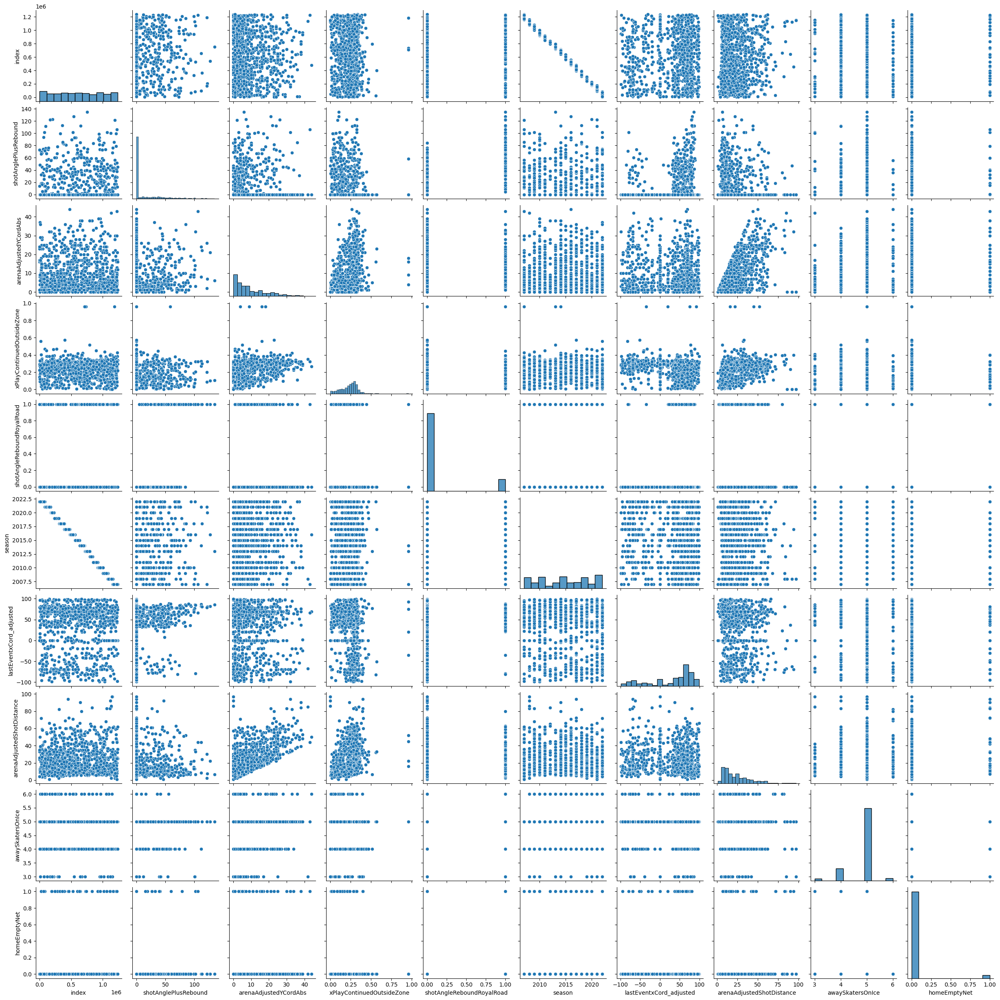

In [31]:
#Pair plot of the first subset

sns.pairplot(subset_1)

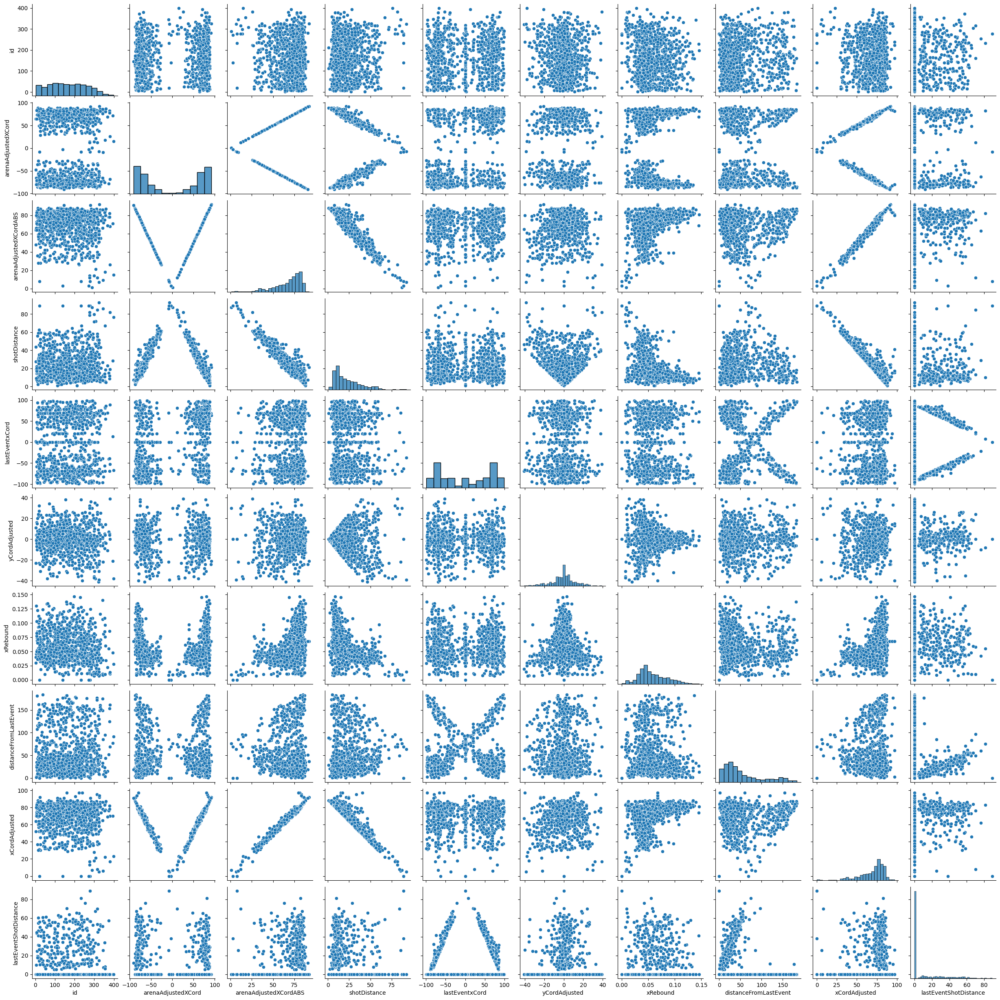

In [32]:
#Pair plot of the second subset

sns.pairplot(subset_2)

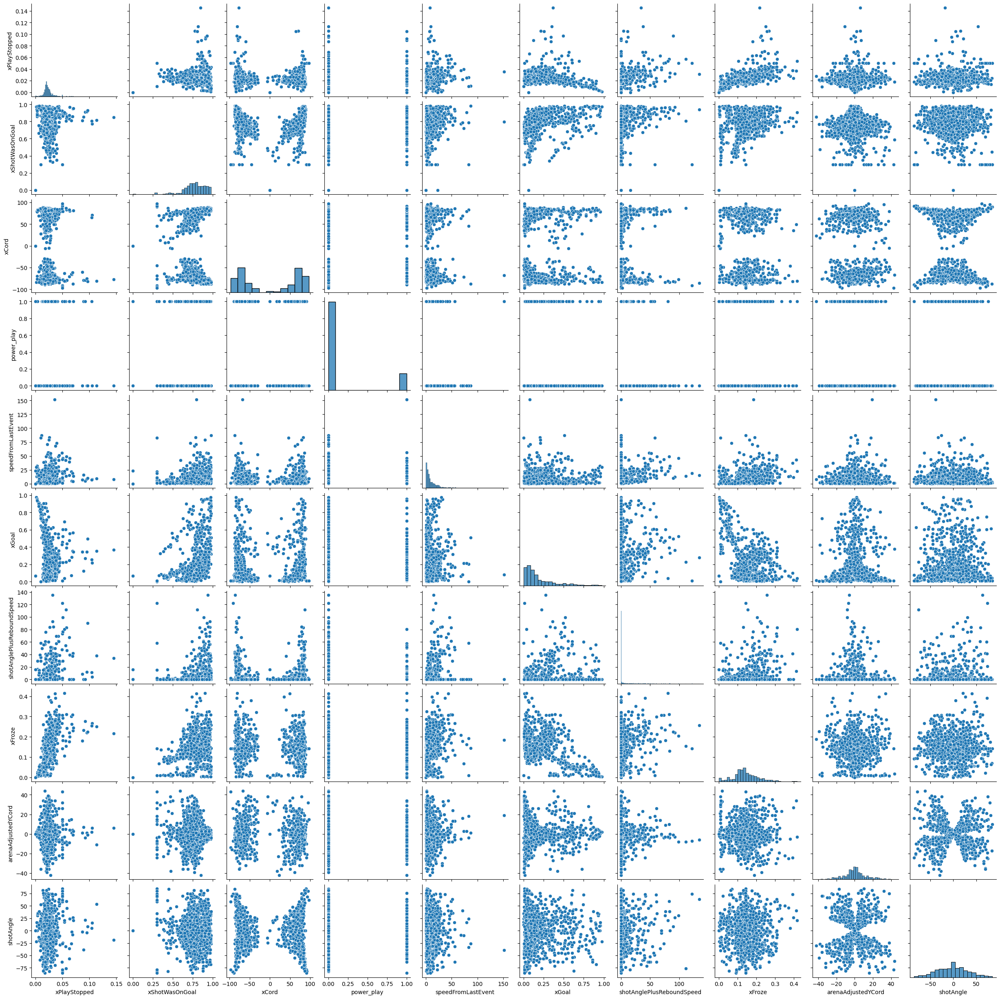

In [33]:
#Pair plot of the third subset

sns.pairplot(subset_3)

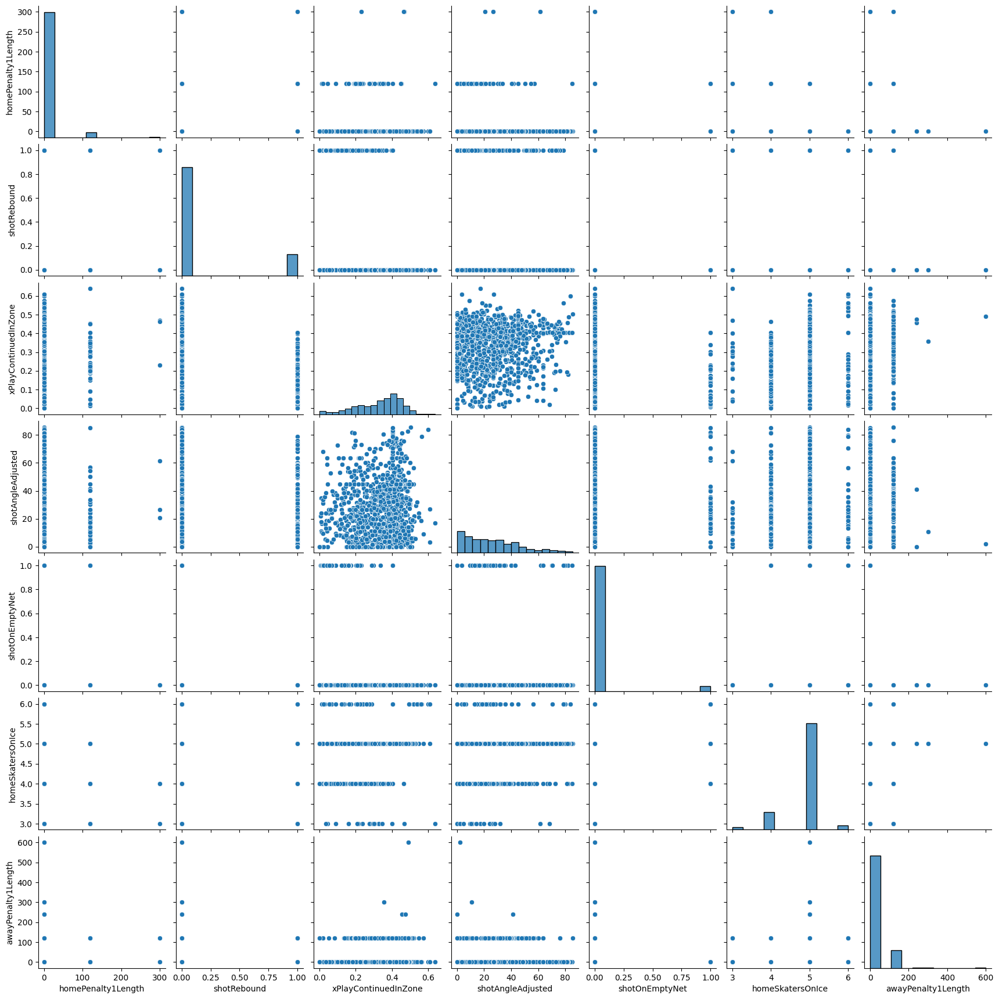

In [34]:
#Pair plot of the fourth subset

sns.pairplot(subset_4)

## Correlations
The findings from the EDA analysis of the variables and correlations revealed that the strongest negative correlation is between the shotDistance and xCordAdjusted (r=-0.96). This makes sense intuitively, as the x coordinate is the NORTH-SOUTH location from the center of the ice. Therefore, there should be a close relationship between the shot distance and x coordinate of the shot. The negative relationship comes from the x coordinate being adjusted as if all shots were at the right end of the rink. Usually makes the coordinate a positive number. 

Additionally, there were two  moderately strong negative correlations. The first between xGoal and xPlayContinueInZone (r=-0.81). This also makes sense intuitively, as the probability of a shot being a goal goes up, you would expect the probability of the play to continue in the zone to go down, since the play is over if it is a goal.

The second, between shotAngle and yCordAdjusted (r=-0.81). Similarly with the strong negative correlation between xCordAdjusted and shotDistance, the y coordinate is the EAST-WEST location from the center of the ice and a shot angle of 0 would come from the center of the ice. The negative relationship comes from the y coordinate being adjusted as if all shots were at the right end of the rink.

There were some moderate correlations between features such as the following:  
* xRebound ----- shotDistance
* shotDistance ----- xShotWasOnGoal 
* lastEventShotDistance  ----- shotRebound

These correlations are not surprising and intuitively make sense in the sport of hockey.

## Conclusion  

Interestingly, There appears to be low or no significant correlation between the target feature and my current numeric features of interest. However, there is evidence of these features having a impact on predicting goal scoring based on the distribution of the features in the data set.

There are correlations that suggest the possibility of multicollinearity and the need to further reduce the dimensionality of my data set.

The next steps include feature engineering and looking into feature importances to determine which features will provide the best results for the model. 